In [1]:
import sys
sys.path.insert(0, "../lib")


try:
    from IrisMatching import *
    from IrisLocalization import *
    from IrisNormalization import *
    from ImageEnhancement import *
    from FeatureExtraction import *
    from drawIrisLocalization import *
    from PerformanceEvaluation import *
except ImportError:
    print('No Import')
    
import cv2
import numpy as np
import matplotlib.pyplot as plt 


In [2]:
filenames= getFilenames()
tfilenames= getFilenames(train = False)

## Get Training data, but not need to run again
Y_train = getLabel(rot = 7);
X_train = getALLFeatures(filenames,Train = True,rot = True, size = 9); 

Y_test = getLabel(rot = 7, train = False);
X_test = getALLFeatures(tfilenames, Train = False,rot = True,size = 9);  

## Save to local data files
Iris_X_train  = np.array(X_train );
np.save('Iris_X_train7',Iris_X_train);
Iris_X_test = np.array(X_test );
np.save('Iris_X_test7',Iris_X_test);

In [3]:
# Comment out below if you would like to test on 7 templates of rotation 
# from rot = [-3,-2,-1,0,1,2,3]
X_train = np.load('../data/Iris_X_train7.npy')
Y_train = getLabel(rot = 7)
X_test = np.load('../data/Iris_X_test7.npy')
Y_test = getLabel(rot = 7, train = False)

In [4]:
# Comment out below if you would like to test on 11 templates of rotation 
# from rot = [-9,-6,-3,-2,-1,0,1,2,3,6,9]
#X_train = np.load('Iris_X_train11.npy')
#Y_train = getLabel(rot = 11)
#X_test = np.load('Iris_X_test11.npy')
#Y_test = getLabel(rot = 11, train = False)

In [5]:
# Comment out below if you would like to test on 19 templates of rotation from (-9, 9)
#X_train = np.load('Iris_X_train19.npy')
#Y_train = getLabel(rot = 19)
#X_test = np.load('Iris_X_test19.npy')
#Y_test = getLabel(rot = 19, train = False)

In [6]:
print(np.shape(X_train))  #3*19*108 = 6156 or 3*11*108 = 3564 or 3*7*108 = 2268
print(np.shape(X_test))
print(np.shape(Y_train))
print(np.shape(Y_test))

(2268, 1536)
(432, 1536)
(2268,)
(432,)


In [7]:
########### test on PCA
lda = LDA(n_components = 107)
lda = lda.fit(X_train, Y_train)
X_train_lda = lda.transform(X_train)
X_test_lda = lda.transform(X_test)
print((np.shape(X_train_lda), np.shape(X_test_lda )))      
#X_train_lda, X_test_lda = reduceFeature(X_train, Y_train, X_test, 'LDA', ncomp = 107)

((2268, 107), (432, 107))


In [8]:
###predict: on 107 features LDA
d1_pred_lda, accuracy_d1_lda = nearestCenterClassifier(X_train_lda,X_test_lda,Y_test,rot = True, distance = 1); print(accuracy_d1_lda)
d2_pred_lda, accuracy_d2_lda = nearestCenterClassifier(X_train_lda,X_test_lda, Y_test,rot = True, distance = 2); print(accuracy_d2_lda)
d3_pred_lda, accuracy_d3_lda = nearestCenterClassifier(X_train_lda,X_test_lda,Y_test,rot = True, distance = 3); print(accuracy_d3_lda)

0.902777777778
0.909722222222
0.930555555556


In [9]:
### predict: on all features
### takes several 2 mins to run all
d1_pred_all, accuracy_d1_all = nearestCenterClassifier(X_train,X_test,Y_test,rot = True, distance = 1); print(accuracy_d1_all)
d2_pred_all, accuracy_d2_all = nearestCenterClassifier(X_train,X_test, Y_test,rot = True,distance = 2); print(accuracy_d2_all)
d3_pred_all, accuracy_d3_all = nearestCenterClassifier(X_train,X_test,Y_test, rot = True,distance = 3); print(accuracy_d3_all)

0.925925925926
0.891203703704
0.895833333333


In [10]:
getTable3([accuracy_d1_all,accuracy_d2_all,accuracy_d3_all],
          [accuracy_d1_lda,accuracy_d2_lda,accuracy_d3_lda])        

,Original Feature Set,Reduced Feature Set
L1 distance measure,0.925926,0.902778
L2 distance measure,0.891204,0.909722
Cosine similarity measure,0.895833,0.930556


## Running Slow, Saved already

In [11]:
ncomp = [50,60,70,80,83,85,90,95,100,107]

###predict: on 107 features LDA (Running Slow, saved already)
accuracyList = []
for i in range(0, len(ncomp)):
    lda = LDA(n_components = ncomp[i] )
    lda = lda.fit(X_train, Y_train)
    X_train_lda = lda.transform(X_train)
    X_test_lda = lda.transform(X_test)
    d3_pred_lda, accuracy_d3_lda = nearestCenterClassifier(X_train_lda,X_test_lda,Y_test, distance = 3)
    accuracyList.append(accuracy_d3_lda)
np.save('accuracyList',accuracyList)

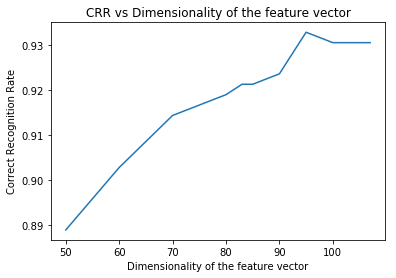

In [12]:
accuracyList = np.load('../data/accuracyList.npy')
drawCRRcurve(ncomp, accuracyList)

In [13]:
# Get Training data without rot
filenames1= getFilenames()
Y_train1 = getLabel(rot = 1)
X_train1 = getALLFeatures(filenames1,Train = True,rot = False, size = 9)  # (2268, 1536)

tfilenames1= getFilenames(train = False)
Y_test1 = getLabel(rot = 1, train = False)
X_test1 = getALLFeatures(tfilenames1, Train = False,rot = False,size = 9)  #(432, 1536)

########### test on lda
lda1 = LDA(n_components = 107)
lda1 = lda1.fit(X_train1, Y_train1)
X_train_lda1 = lda1.transform(X_train1)
X_test_lda1 = lda1.transform(X_test1)
print((np.shape(X_train_lda1), np.shape(X_test_lda1 ))) 

###predict: on 107 features LDA
d1_pred_lda1, accuracy_d1_lda1 = nearestCenterClassifier(X_train_lda1,X_test_lda1,Y_test1,rot = False, distance = 1); print(accuracy_d1_lda1)
d2_pred_lda1, accuracy_d2_lda1 = nearestCenterClassifier(X_train_lda1,X_test_lda1, Y_test1,rot = False, distance = 2); print(accuracy_d2_lda1)
d3_pred_lda1, accuracy_d3_lda1 = nearestCenterClassifier(X_train_lda1,X_test_lda1,Y_test1,rot = False, distance = 3); print(accuracy_d3_lda1)

/Users/wentingyu/anaconda/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


((324, 107), (432, 107))
0.858796296296
0.881944444444
0.905092592593


In [14]:
########### test on PCA
lda = PCA(n_components = 107)
lda = lda.fit(X_train, Y_train)
X_train_pca = lda.transform(X_train)
X_test_pca = lda.transform(X_test)
print((np.shape(X_train_pca), np.shape(X_test_pca )))


((2268, 107), (432, 107))


In [15]:
###predict: on 107 features PCA
d1_pred_pca, accuracy_d1_pca = nearestCenterClassifier(X_train_pca,X_test_pca,Y_test, distance = 1); print(accuracy_d1_pca)
d2_pred_pca, accuracy_d2_pca = nearestCenterClassifier(X_train_pca,X_test_pca, Y_test,distance = 2); print(accuracy_d2_pca)
d3_pred_pca, accuracy_d3_pca = nearestCenterClassifier(X_train_pca,X_test_pca,Y_test, distance = 3); print(accuracy_d3_pca)

0.888888888889
0.837962962963
0.842592592593


## Comparation of LDA and PCA
- As we can see from the following table, LDA is doing much better than PCA

In [16]:
getTable4([accuracy_d1_lda,accuracy_d2_lda,accuracy_d3_lda],
          [accuracy_d1_pca,accuracy_d2_pca,accuracy_d3_pca]) 

,LDA Reduced Feature Set,PCA Reduced Feature Set
L1 distance measure,0.902778,0.888889
L2 distance measure,0.909722,0.837963
Cosine similarity measure,0.930556,0.842593


## Visualize the Iris Segmentation Effect

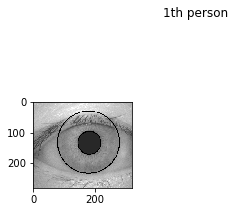

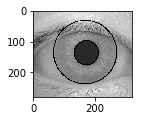

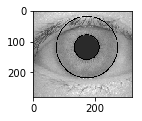

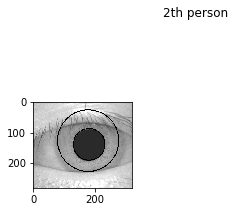

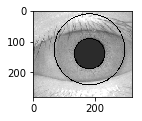

...

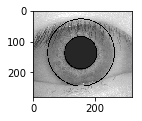

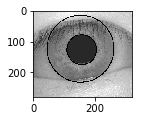

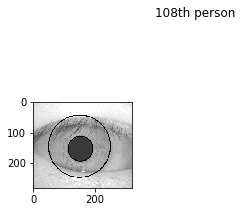

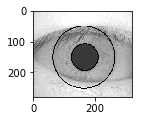

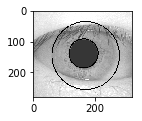

In [ ]:
# Iris Localization for Training data
drawAllIris(filenames, train = True)

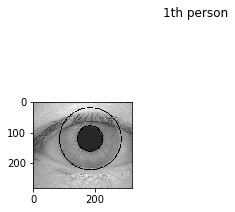

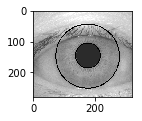

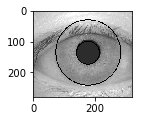

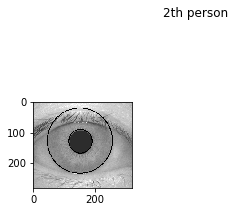

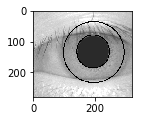

...

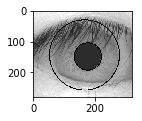

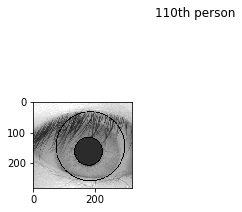

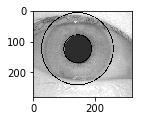

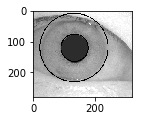

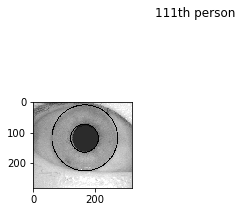

In [ ]:
# Iris Localization for Testing data
drawAllIris(tfilenames, train = True)